# Treci domaci zadatak iz predmeta digitalna obrada slike 
## Esmir Pljakic 0205/2017, OS

In [1]:
# Ucitavanje potrebnih biblioteka koje su neophodne za dalji rad
from __future__ import print_function

%matplotlib inline
import scipy
from scipy import ndimage
from scipy import *
from pylab import *

import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual

import skimage
from skimage import *
from skimage import color
from skimage.color import rgb2gray
from skimage.color import *
from skimage import exposure
from skimage import filters
from skimage import feature
from skimage import io

from skimage.transform import hough_line
from skimage.draw import line

import cv2
import os
import subprocess
import glob

import numpy as np

In [2]:
# Ova funkcija ima ulogu za iscrtavanje slika
def ploting(image, cmap):
    fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(24,20), dpi=80)
    ax = axes.ravel()
    ax[0].imshow(image[0], cmap = cmap)
    ax[1].imshow(image[1], cmap = cmap)
    ax[2].imshow(image[2], cmap = cmap)
    ax[3].imshow(image[3], cmap = cmap)
    ax[4].imshow(image[4], cmap = cmap)
    ax[5].imshow(image[5], cmap = cmap)
    
    for a in ax:
        a.axis('off')
    tight_layout()
    plt.show()

### Isrctavanje ulaznih - test slika

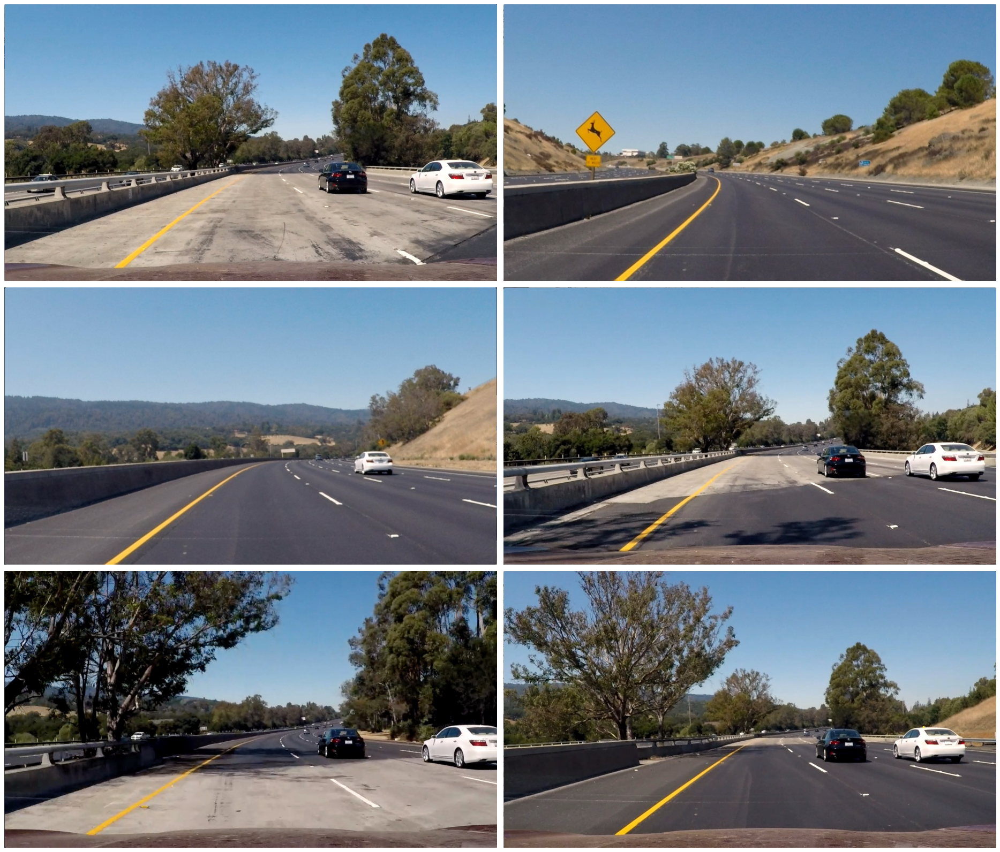

In [3]:
# Ucitavanje ulaznih - test slika u jednom nizu slika
image = [0]*6
image[0] = imread('../sekvence.test1.jpg')
image[1] = imread('../sekvence.test2.jpg')
image[2] = imread('../sekvence.test3.jpg')
image[3] = imread('../sekvence.test4.jpg')
image[4] = imread('../sekvence.test5.jpg')
image[5] = imread('../sekvence.test6.jpg')
ploting(image, 'jet')

## Prva funkcija - segment_lanes

U okviru funkcije <i>segment_lanes</i> je potrebno izvrsiti segmentaciju zeljenih predmeta na slici. Na slikama se nalazi put, a na putu se nalaze kolovozne trake koje su nama izuzetno vazne za ovaj zadatak. Zadatak ove funkcije jeste da izdvoji kolovozne trake. Slika dobijena nakon ove funkcije ce biti koriscena u daljem delu zadatka za detekciju datih traka.

Pocetna ideja mi je bila pronaci odgovarajuci kolor sistem koji ce najbolje izdvojiti belu i zutu boju, jer su tim bojama obojene trake na putu koje je potrebno izdvojiti. Trazio sam po kolor sistemima i dobijao razne rezultate i ideje. Pomislio sam najpre da pronadjem jedno obelezje koje ce izdvojiti belu boju na osnovu nekog kolor sistema i drugo obelezje koje ce da izdvoji zutu boju na osnovu nekog drugog kolor sistema i da onda na osnovu te dve maske formiram konacnu koja ce izdvajati obe trake. <b>HSV</b> kolor sistem je radio lepo, ali sam uocio drugi sistem, a to je <b>RGB</b>. Na taj nacini nisam morao vrsiti konverziju slike iz RGB -> HSV i tako ustedeo na vremenu. Komponenta koju sam koristio jeste R. Na mestima gde su kolovozne trake R komponenta je imala izuzetno velike vrednosti, pa je to prakticno postalo glavno obelezje pri segmentaciji slike.

In [23]:
def segment_lanes(img_in):
    # Kopiramo sliku jer ne zelimo da menjamo ulaznu sliku
    f_rgb = np.copy(img_in)
    
    # Kreiramo obelezje na osnovu koga ce se izvrsiti segmentacija
    pattern_1 = (img_in[:,:,0] > 225)
    # Belezimo dimenzije ulazne slike
    dimension = shape(img_in)

    # Kreiramo masku na osnovu prethodnog obelezja
    mask_1 = np.zeros((dimension[0], dimension[1]))
    mask_1[pattern_1] = 1
    mask_1[~pattern_1] = 0

    # Delove koji ne pripadaju trakama bojimo u crno
    f_rgb[:, :, 0] = zeros(shape(f_rgb[:, :, 0])) + 1*(mask_1)*f_rgb[:, :, 0]
    f_rgb[:, :, 1] = zeros(shape(f_rgb[:, :, 1])) + 1*(mask_1)*f_rgb[:, :, 1]
    f_rgb[:, :, 2] = zeros(shape(f_rgb[:, :, 2])) + 1*(mask_1)*f_rgb[:, :, 2]
    
    # Povratak segmentirane slike
    return f_rgb

### Isrctavanje segmentiranih - ulaznih slika

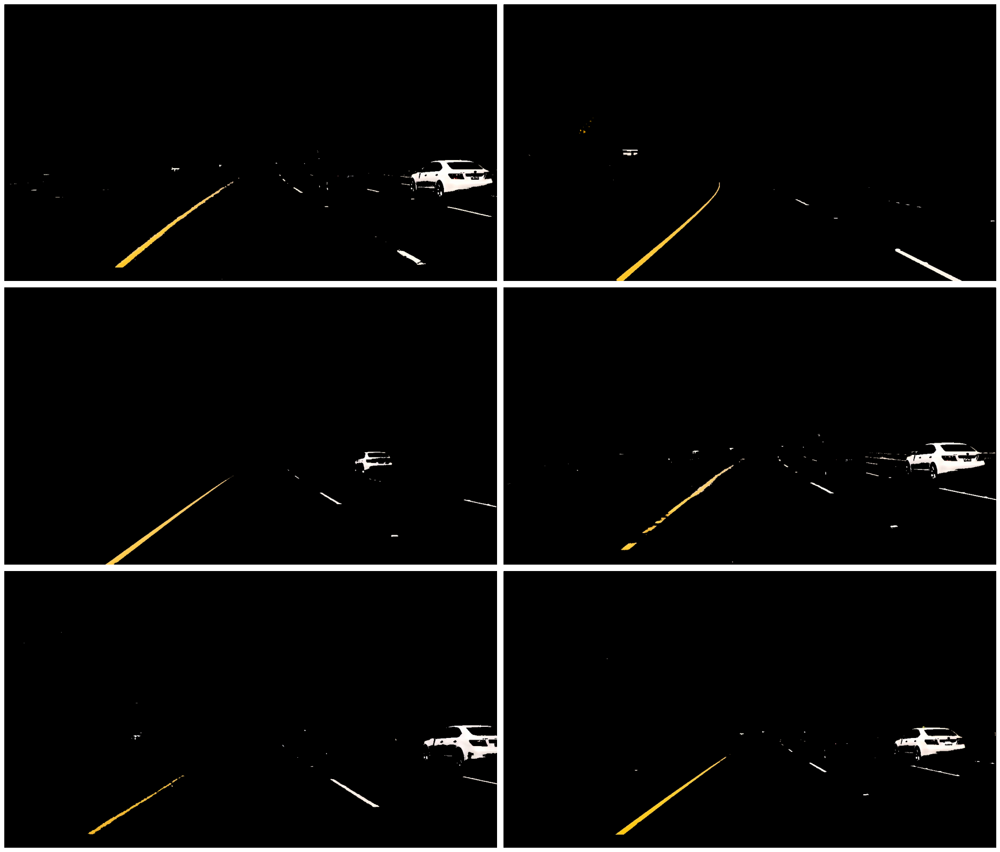

In [5]:
image_segment = [0]*6
for i in range(0, 6):
    image_segment[i] = segment_lanes(image[i])
ploting(image_segment, 'jet')

## Druga funkcija - canny_edge_detection

Uloga funkcije <i>canny_edge_detection</i>, kao sto joj samo ime kaze, jeste da pronadje ivice na datoj slici. Ulaz ove funkcije predstavlja segmentirana slika iz prethodnog zadatka. Koristimo Kenijev operator jer ima superiorne karakteristike u pogledu detekcije ivica. Postoje cetiri koraka kod Kenijevog operatora za detekciju ivice.

<b>Prvi korak</b> : Najpre se primeni odgovarajuci operator za detekciju gradijenta. U Kanijevom algoritmu se koristi DroG operator, ali smo mi u domacem zadatku koristili Sobelov operator. Podesavanjem σ Gausove funkcije postize se kompromis izmedju lokalizacije i osetljivosti na sum. U nasem domacem smo usvojili da je σ = 3.

<b>Drugi korak</b> : Sledeci korak predstavlja potiskivanje lokalnih ne-maksimuma u pravcu gradijenta. Zadrzavaju se samo maksimalne vrednosti gradijenata u smeru normalne na ivicu. Na ovaj način seobezbeđuje jedinicni odziv na ivicu.

<b>Treci korak</b> : Nakon potiskivanja lokalnih ne-maksimuma obavlja se histerezisnoporedjenje s pragom. Ideja je da se formiraju dve mape ivica: jakih i slabih. Jake ivice sigurno predstavljaju ivicne piksele, dok slabe ivice potencijalno predstavljaju ivicne piksele.

<b>Cetvrti korak</b> : Zadrzavanje slabih ivica povezanih sa jakim ivicama.

Pre koriscenja Sobelovog operatora za detekciju gradijenta potrebno je ulaznu sliku pretvoriti u sivu, a nakon toga uraditi filtriranje pomocu Gausovog filtra, kako bi ocistili sliku od suma. Nakon toga sam primenio Sobelov operator koji ce da pronadje gradijente na slici i onamo gde su vrednosti operatora velike znaci da se tu nalaze ivice. Nakon toga je bilo potrebno uraditi potiskivanje nelokalnih maksimuma u pravcu gradijenta i kvantizacija gradijenta. Taj problem je resen tako sto smo prolazili kroz celu sliku piksel po piksel i u zavisnosti od pravca njegovog gradijenta tj. ugla smo vrsili kvantizaciju i njegovo poredjenje sa odgovarajucom okolinom. Na taj nacin smo dobili sliku na kojoj se nalaze ivice debljine jednog piksela. Medjutim na toj slici sada neke ivice predstavljaju stvarno ivice, a neke i ne, pa je potrebno odraditi histerezisno poredjenje i na osnovu toga utvrditi koje ivice predstavljaju prave ivice, a koje ivice ne. To je reseno jednostavnim poredjenjem sa pragovima koji su ulasni argumenti ove funkcije. Napravio sam sliku koja je cela crna i ima dimenzije koje odgovoraju ulaznoj slici. Na mestima gde ivicni pikseli prelaze gornji prag ta slika dobija veliku vrednost i znaci da je jaka ivica,a ukoliko ivicni pikseli prelaze nizi prag, slika dobija malu vrednost i znaci da je slaba ivica.

Posljednji korak jeste spajanje slabih i jakih ivica. Ukoliko se u okolini slabog ivicnog piksela nalazi neki jaki ivicni piksel onda se taj slabi ivicni piksel proglasi jakim. Taj metod se obavlja iterativno sve dok na primer kolicina jakih piksela u slici ne bude jednaka u prethodnoj i poslednjoj iteraciji. Medjutim ja nisam zeleo da uvodim while petlju koji ca da uspori ovu funkciju vec sam razmisljao na sledeci nacin. Uocio sam da se uglavnom jake ivice nalaze na dnu slike, tacnije na pocecima kolovoznih traka, a da se slabe ivice nalaze uglavnom na krajevima tih traka koje je potrebno detektovati odnosno pri vrhu slike. Kako bih ustedeo na vremenu ja sam samo jednom prosao kroz sliku od donjeg dela ka vrhu i tako spojio sve slabe ivice koje su bile vezane uz jake. Ovo vazi samo za kolovozne trake koje je potrebno detektovati, da se trazilo nesto drugo radio bih iterativno, ali mislim da je ovo bolje resenje od iterativnog, jer se dobijaju isti rezultati za manji broj vremena, a trake su detektovane lepo.

In [6]:
def canny_edge_detection(img_in, threshold_low, threshold_high, sigma=3):
    # Transformacija ulazne slike u sivu boju 
    img_gray = rgb2gray(img_in)
    
    # Filtriranje ulazne slike Gausovom funkcijom
    img_gauss = filters.gaussian(img_gray, sigma=sigma, mode='nearest', truncate=10/sigma)
    
    # Sobelov operator
    Hx = np.array([[-1, -2, -1],[0, 0, 0],[1, 2, 1]])
    Hy = np.transpose(Hx)
    
    # Izracunavanje vertikalnog i horizontalnog gradijenta slike
    Gx = scipy.ndimage.correlate(img_gauss, Hx, mode='nearest')
    Gy = scipy.ndimage.correlate(img_gauss, Hy, mode='nearest')
    
    # Magnituda gradijenta
    img_magnitude = np.sqrt(np.square(Gx) + np.square(Gy))
    
    # Ugao gradijenta
    angle = np.arctan2(Gy, Gx)
    img_angle = np.rad2deg(angle)
    img_angle[img_angle < 0] += 180
    
    # Kvantizacija gradijenata i pootiskivanje lokalnih ne-maksimuma
    M, N = img_gray.shape
    shape = (M,N)
    Z = np.zeros(shape)
    
    for i in range(1,M-1):
        for j in range(1,N-1):  
            lokalni_1 = 0
            lokalni_2 = 0
            # Ugao 0 - stepeni
            if (0 <= img_angle[i,j] < 22.5) or (157.5 <= img_angle[i,j] <= 180):
                angle[i,j] = 0
                lokalni_1 = img_magnitude[i-1, j]
                lokalni_2 = img_magnitude[i+1, j]
            # Ugao 45 - stepeni
            elif (22.5 <= img_angle[i,j] < 67.5):
                angle[i,j] = 45
                lokalni_1 = img_magnitude[i-1, j-1]
                lokalni_2 = img_magnitude[i+1, j+1]
            # Ugao 90 - stepeni
            elif (67.5 <= img_angle[i,j] < 112.5):
                angle[i,j] = 90
                lokalni_1 = img_magnitude[i, j-1]
                lokalni_2 = img_magnitude[i, j-1]
            # Ugao 135 - stepeni
            elif (112.5 <= img_angle[i,j] < 157.5):
                angle[i,j] = -45
                lokalni_1 = img_magnitude[i+1, j-1]
                lokalni_2 = img_magnitude[i-1, j+1]
            # Odredjivanje da li je taj piksel lokalni maksimum
            if (img_magnitude[i,j] >= lokalni_1) and (img_magnitude[i,j] >= lokalni_2):
                Z[i,j] = img_magnitude[i,j]
            else:
                Z[i,j] = 0
                
    # Jake i slabe ivice
    strong = 1
    weak = 0.2
    zero = 0
    K = np.zeros(shape)
    K[Z>=threshold_high] = strong
    K[Z<threshold_low] = zero
    K[(Z>=threshold_low) & (Z<threshold_high)] = weak
    
    # Povezivanje slabih ivica sa jakim
    # Ovde bih imao while koji ce se izvrsavati dok god kolicina jakih ivica ne bude jednaka preth. kolicini jakih ivica 
    for i in range(M-1, 0, -1):
        for j in range(1, N-1):
            if (K[i,j] == weak):
                if ((K[i+1, j-1] == strong) or (K[i+1, j] == strong) 
                    or (K[i+1, j+1] == strong) or (K[i, j-1] == strong)
                    or (K[i, j+1] == strong) or (K[i-1, j-1] == strong)
                    or (K[i-1, j] == strong) or (K[i-1, j+1] == strong)):
                    # Ukoliko u okolini ima jakih ivica, ta slaba ivica se proglasava jakom
                    K[i, j] = strong
                else:
                    # U slucaju da nema jakih ivica, ona se postavlja na 0
                    K[i, j] = zero
    
    # Povratak slike sa detektovanim ivicama
    return K

### Isrctavanje slika sa detektovanim ivicama

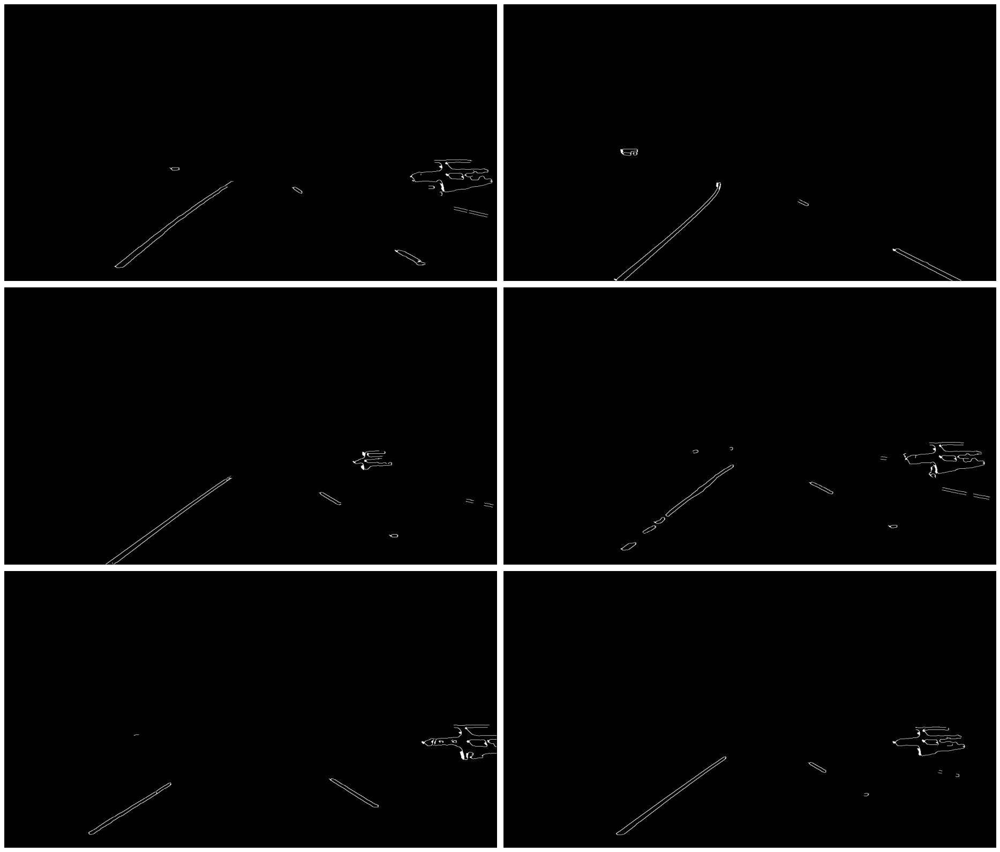

In [7]:
image_canny = [0]*6
for i in range(0, 6):
    image_canny[i] = canny_edge_detection(image_segment[i], 0.05, 0.5)
ploting(image_canny, 'gray')

## Treca funkcija - get_line_segments

Funkcija <i>get_line_segments</i> ima ulogu da na osnovu slike gde su detektovane ivice izdvoji duzi koji se nalaze na odgovarajucim pravama. Parametri koji odredjuju pravu nalaze se u argumentu <b>line</b>, ti parametri predstavljaju izlazne vrednosti Hafove transformacije i to rastojanje i ugao. Pomocu ova dva parametra jedna prava je jednoznacno opisana. Sledeci parametar <b>min_size</b> nam govori da nase detektovane duzi ne smeju imati manje duzine od ove minimalne duzine, parametar <b>max_gaps</b> nam govori koliko mozemo, da kazem, supljina zanemariti prilikom detekcije trake i poslednji parametar <b>tolerancy</b> govori o tome u kom okruzenju u odnosu na pravu mozemo traziti ivicne piksele kolovoznih traka.

Ova funkcija ce se pozivati nakon funkcije za detekciju ivica i nakon Hafove transformacije. Moja ideja prilikom izrade ove funkcije je sledeca. U zadatku se trazilo da ova funkcija vrati duzi odredjenih duzina, a da nakon toga u cetvrtoj funkciji odredimo pocetne i krajnje tacke tih duzi, medjutim ja sam odradio sve to u ovoj jednoj funkciji, a u okviru cetvrte funkcije, sto ce te videti u nastavku, samo pozivam sve ove funkcije i unutar nje imam poziv za Hafovu transformaciju. Tako da meni ova funkcija vraca dakle pocetnu i krajnju tacku linije za cije argumente je pozvana.

Posto se desavalo da prilikom testiranja na video jednostavno neki frejmovi ne rade iz ne znam kog razloga, napravio sam da za takve frejmove teta i ro iz Hafove transformacije budu jednaki nuli i onda ovde na pocetku ispitujem taj uslov ukoliko je naisao taj frejm koji nije mogao da se obradi da odmah vratim tacke koje imaju parametre (0,0) i (0,0). Kasnije cete videti kako se dalje ti frejmovi koji imaju problem obradjuju. Definisao sam parametre koje ce mi oznacavati pocetne i krajnje tacke detektovane linije. Promenljiva <b>first</b> ima ulogu da ukoliko naidjemo na prvi beli piksel, na zadatoj pravoj, taj piksel zapamtimo kao pocetak date duzi, promenljiva <b>gap</b> broji u toku kretanja po toj pravoj koliko imamo procepa medju belim pikselima, promenljiva <b>size</b> meri duzinu detektovane linije, promenljiva <b>last_x</b> i <b>last_y</b> beleze prethodne koordinate koje smo imali na slici, promenljiva <b>detected</b> oznacava da je neka linija detektovana i u trenutku njenog postavljanja na 1, znaci da imamo vec neke pocetne i krajnje tacke i promenljiva <b>lines</b> znaci da se nalazimo na liniji, tj. znaci da smo detektovali pocetnu tacku i da svaki naredni piksel potencijalno predstavlja piksel kolovozne trake.

Na samom pocetku sam napravio crnu sliku koja ima jedinice na onim mestima prave u cijoj se okolini nalaze ivicni pikseli trake. Okolina u kojoj ja pretrazujem ivicne piksele opet zbog samog problema sam izabrao da bude jedna horizontala koja ce gledati da li se levo ili desno nalaze ivicni pikseli. Ovakva okolina nece moci da detektuje horizontalne ivice, ali posto sam problem ne zahteva detekciju horizontalnih ivica odlucio sam se na ovakvu okolinu. Da je bilo potrebno detektovati i horizontalne ivice napravio bih okolinu oblika matrice i to bi resilo problem. Na taj nacin sam napravio sliku koja na mestima traka ima jedinicne piksele koji su beli. Kasnije se ta slika koristi pri odredjivanju pocetnih i krajnjih tacaka.

Ukoliko je procesirani piksel beo i ako nismo pre toga detektovali bele piksele onda se ta pozicija pamti kao pocetna tacka (x1,y1), ukoliko imamo prelezak sa belog na crni piksel onda tu belezimo kranju tacku (x2, y2), u tom trenutku zabelezimo da smo detektovali jednu liniju i onda pocinjemo da brojimo crne piksele koji slede posle toga. Ukoliko je taj procep manji od max_gaps-a onda se ta duzina koju je gap izbrojao dodaje na size i onda cekamo sledeci prelaz sa belog na crni piksel kako bi zabelezili novu krajnju tacku (x2,y2). Ako se sve to desilo i detektovali smo pocetnu i kranju tacku i ako je njena duzina manje od minimalne prihvatljive duzine onda se sve resetuje na 0 i ide se dalje po pravoj da se pronadje druga linija cija je duzina veca od minimalne prihvatljive. To sluzi kako ne bismo detektovali one male tracice koje se nalaze u desnoj kolovoznoj traci. Na samom kraju pravimo vektor od pocetnih i kranjih tacaka detektovanih traka i to saljemo kao izlaz iz funkcije.

In [12]:
def get_line_segments(img_edges, line, min_size, max_gaps, tolerancy):
    # Tacka koja ce se vratiti u slucaju neregularnog frejma
    points_def = [0, 0, 0, 0]
    # U narednoj funkciji sam postavio ro i teta = 0, pa zbog toga ovaj uslov ovde
    if(line[0] == 0) & (line[1] == 0):
        return points_def
    
    # Pocetne i krajnje tacke
    x_1 = 0
    x_2 = 0
    y_1 = 0
    y_2 = 0
    # Parametri za prolazak kroz pravu
    first = 0
    size = 0
    gap = 0
    last_x = 0
    last_y = 0
    detected = 0
    lines = 0
    
    # Kreiranje promenljivih za formiranje jednacine prave
    cos = np.cos(line[0])
    sin = np.sin(line[0])
    r = line[1]
    
    # Kreiranje crne slike
    s = shape(img_edges)
    img_zeros = np.zeros(s)
    # Ovo je petlja gde postavljamo bele piksele na mesta gde su kolovozne trake
    for x in range(img_edges.shape[0] - 1, -1, -1):
        # Na ovaj nacin dobijamo indekse za sliku
        # Jedan indeks predstavlja brojac, a drugi dobijamo iz jednacine prave
        y = (r - x * sin) / cos
        if y < 1200:
            if sum(img_edges[x, int(y) - tolerancy : int(y) + tolerancy]) > 0:
                img_zeros[x][int(y)] = 1
    
    # Petlja u kojoj pamtimo pocetne i kranje tacke    
    for x in range(img_edges.shape[0] - 1, -1, -1):
        y = (r - x * sin) / cos
        if y < 1200 :
            # Detektovanje pocetne tacke
            if (img_zeros[x][int(y)] > 0) & (first == 0) & (lines == 0):
                x_1 = x
                y_1 = int(y)
                size += 1
                first = 1
                lines = 1
            
            # Detektovanje poslednje tacke
            if (img_zeros[x][int(y)] == 0) & (img_zeros[last_x][last_y] > 0) & (lines == 1):
                x_2 = last_x
                y_2 = last_y
                if gap > 0:
                    size = size + gap
                gap = 0
                gap += 1
                lines = 0
                detected = 1
                
            # Kada imamo bele piksele i detektovali smo pocetnu tacku
            if (img_zeros[x][int(y)] > 0) & (lines == 1):
                size += 1
             
            # Kada imamo crne piksele i detektovali smo krajnju tacku
            if (img_zeros[x][int(y)] == 0) & (lines == 1) & (detected == 1):
                gap += 1
            
            # Ukoliko je gap premasio max_gaps zavrsavamo sa detekcijom
            if (gap > max_gaps) & (detected == 1):
                lines = 0
            # Ukoliko je velicina manja ponovo pocinjemo sa detekcijom
                if size < min_size:
                    first = 0
                    size = 0
                    detected = 0
            elif (gap < max_gaps) & (detected == 1):
                lines = 1
        
            # Belezenje poslednjih indeksa slike
            last_x = x
            last_y = int(y)
      
    # Formiranje vektora tacaka
    points = [x_1, y_1, x_2, y_2]
    """""
    fig, axes = plt.subplots(ncols = 2, figsize=(24,20))
    ax = axes.ravel()
    ax[0].imshow(img_edges, cmap = 'gray')
    ax[1].imshow(img_zeros, cmap = 'gray')
    tight_layout()
    plt.show()
    """""
    # Povratak pocetnih i krajnjih tacaka
    if size > min_size:
        return points
    else:
        return points_def

Rezultate ove funkcije kako radi cu pokazati tek nakon poslednje funkcije, posto je potrebno uraditi Hafovu transformaciju.

## Cetvrta funkcija - lane_detection

Ova funkcija objedinjuje sve do sad napisane funkcije, poziva ih u sebi i kao rezultat vraca niz tacaka leve i desne trake zajedno. Unutar nje pozivam dva puta Hafovu transformaciju jednom za levu a drugi put za desnu traku, posto su razliciti uglovi pod kojima se nalaze ove prave. Uglove za koje ce Haf pokusati da nadje prave sam ogranicio na neke normalne opsege, na primer za desnu traku posto su uglovi negativni uzeo sam opseg od -pi/2 do 0, a za desnu draku od 0 do pi/2. Nakon dobijanja pravih uocio sam otprilike koji su to uglove i koje su to duzine koje odgovaraju pravama koje odgovaraju pravama kolovoznih traka. Nakon poziva Hafove transformacije dobijamo dosta pravih, sve te prave ne odgovaraju kolovoznim trakama. Poznavajuci uglove i rastojanja koja odgovaraju kolovoznim trakama napravio sam jedan uslov i prosao kroz sve prave koje vrati Hafova transformacia i na taj nacin sam izdvojio sve one validne prave i nakon toga sam izvrsio njihovo usrednjavanje. 

U ovom delu se moze videti taj detalj kada je frejm neregularan odnosno kad Hafova transformacija ne uspe da nadje ogovarajucu pravu na datom frejmu tada postavim da su ro i teta jednaki nuli, jer zbog toga se desi da video pukne zato sto imam deljenje sa nulom, ali videcete da je to par nekih frejmova koji ne mogu da se obrade i nije mi bilo bas najjasnije zasto bas ne moze uvek da prepozna, jer sam stavio dosta sirok opseg za trazenje pravih.

In [19]:
def lane_detection(image):
    # Pozivanje za segmentaciju
    f1 = segment_lanes(image)
    # Pozivanje za detekciju ivica
    f2 = canny_edge_detection(f1, 0.05, 0.5)
    
    # Uglovi i distance za levu i desnu traku
    theta_l = 0
    theta_r = 0
    rho_l = 0
    rho_r = 0
    num = 0
    
    # Hafova transformacija za desnu traku
    theta_ = np.linspace(-np.pi/2, 0, 360, endpoint = False)
    [out, angles, distances] = skimage.transform.hough_line(f2, theta = theta_)
    [intensity, peak_angles, peak_distances] = skimage.transform.hough_line_peaks(out, angles, distances, min_distance=2, min_angle=5, threshold=None, num_peaks=20)
    for angle, dist in zip(peak_angles, peak_distances):
        if (dist < 0) & (np.rad2deg(angle) > -70):
            num += 1
            theta_r += angle
            rho_r += dist
    if num == 0:
        theta_r = 0
        rho_r = 0
    else:
        theta_r = theta_r / num
        rho_r = rho_r / num
    line_r = np.array([theta_r, rho_r])
    # Pozivanje f-je za pronalazenje pocetnih i krajnjih tacaka
    points_r = get_line_segments(f2, line_r, 10, 20, 10)

    # Hafova transformacija za levu traku
    num = 0
    theta_ = np.linspace(0, np.pi/2, 360, endpoint = False)
    [out, angles, distances] = skimage.transform.hough_line(f2, theta = theta_)
    [intensity, peak_angles, peak_distances] = skimage.transform.hough_line_peaks(out, angles, distances, min_distance=0, min_angle=5, threshold=None, num_peaks=20)
    for angle, dist in zip(peak_angles, peak_distances):
        if dist > 600:
            num += 1
            theta_l += angle
            rho_l += dist
    if num == 0:
        theta_l = 0
        rho_l = 0
    else:
        theta_l = theta_l / num
        rho_l = rho_l / num
    line_l = np.array([theta_l, rho_l])
    # Pozivanje f-je za pronalazenje pocetnih i krajnjih tacaka
    points_l = get_line_segments(f2, line_l, 10, 50, 15)
    
    # Formiranje konacnog vektora tacaka
    points = [points_r, points_l]
    #print(points)
    return points

### Isrctavanje medjukoraka u funkciji get_line_segments i ispisivanje koordinata tacaka

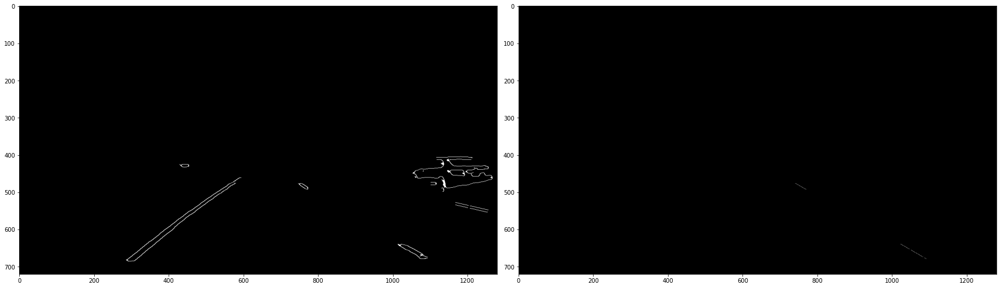

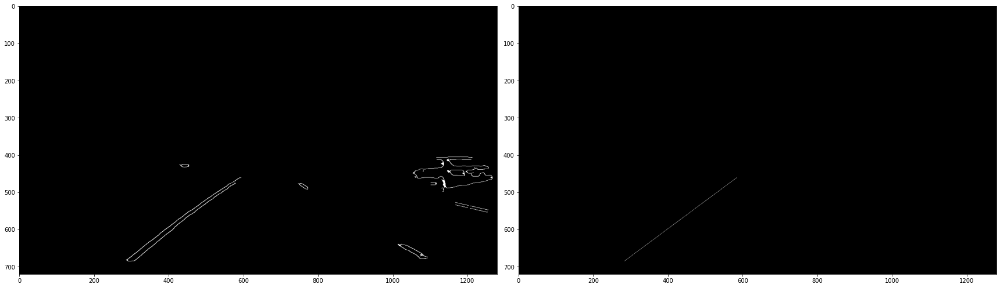

[[678, 1091, 639, 1023], [684, 284, 461, 583]]


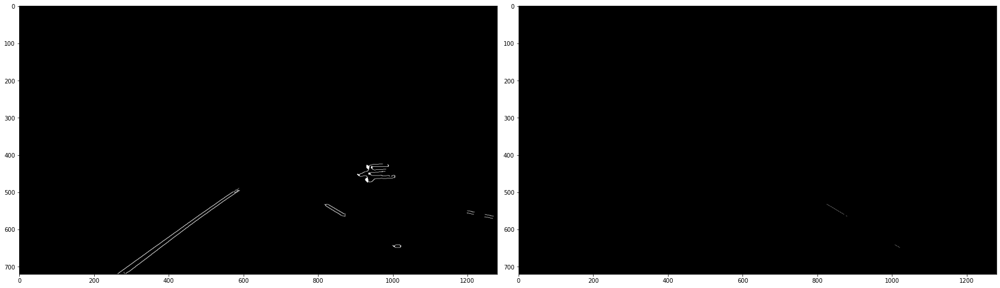

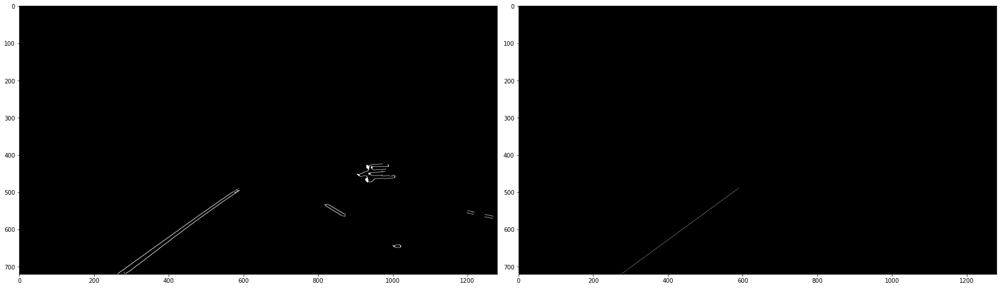

[[564, 879, 532, 825], [718, 276, 489, 589]]


In [11]:
x1 = lane_detection(image[0])
x2 = lane_detection(image[2])

In [14]:
def combine_images(image, initial_image, α=0.9, β=2.5, λ=0.0):
    """""
    Funkcija ima ulogu da primi dve slika i da ih spoji.
    Svaka slika se mnozi odgovorajucim koeficijentom i onda tako pomnozene zajedno formiraju jednu konacnu sliku.
    ulaz:
    dve slike
    parametri alfa, beta, gama
    izlaz:
    slika nastala kombinovanjem ulaznih slika
    """""
    combined_image = cv2.addWeighted(initial_image, α, image, β, λ)
    return combined_image

Napravio sam funkciju <i>lines</i> koja ce za ulaznu sliku da pozove funkciju za dobijanje koordinata pocetnih i krajnjih tacaka kolovoznih traka sa date slike i da ih potom iscrta na crnoj slici. Nakon formiranje crne slike sa ucrtanim kolovoznim trakama pozivamo funkciju koja ce da spoji ove dve slike i da formira konacnu sliku sa ucrtanim kolovoznim trakama.

In [17]:
def lines(image):
    # Pozivanje funkcije za dobijanje tacaka
    points = lane_detection(image)
    # Formiranje crne slike
    lines_image = np.zeros((image.shape[0], image.shape[1], 3), dtype=np.uint8)
    # Petlja koja prvo iscrta desnu pa levu traku
    for i in range(0,2):
        x1,y1,x2,y2 = points[i]
        if (x1 != 0) & (y1 != 0) & (x2 != 0) & (y2 != 0):
            # Ucrtavanje pravih na crnoj slici
            cv2.line(lines_image, (y1, x1), (y2, x2), (0, 120, 0), 12)
    
    # Konacna slika
    image_final = combine_images(lines_image, image)
    
    return image_final

### Iscrtavanje ulaznih slika sa ucrtanim detektovanim kolovoznim trakama

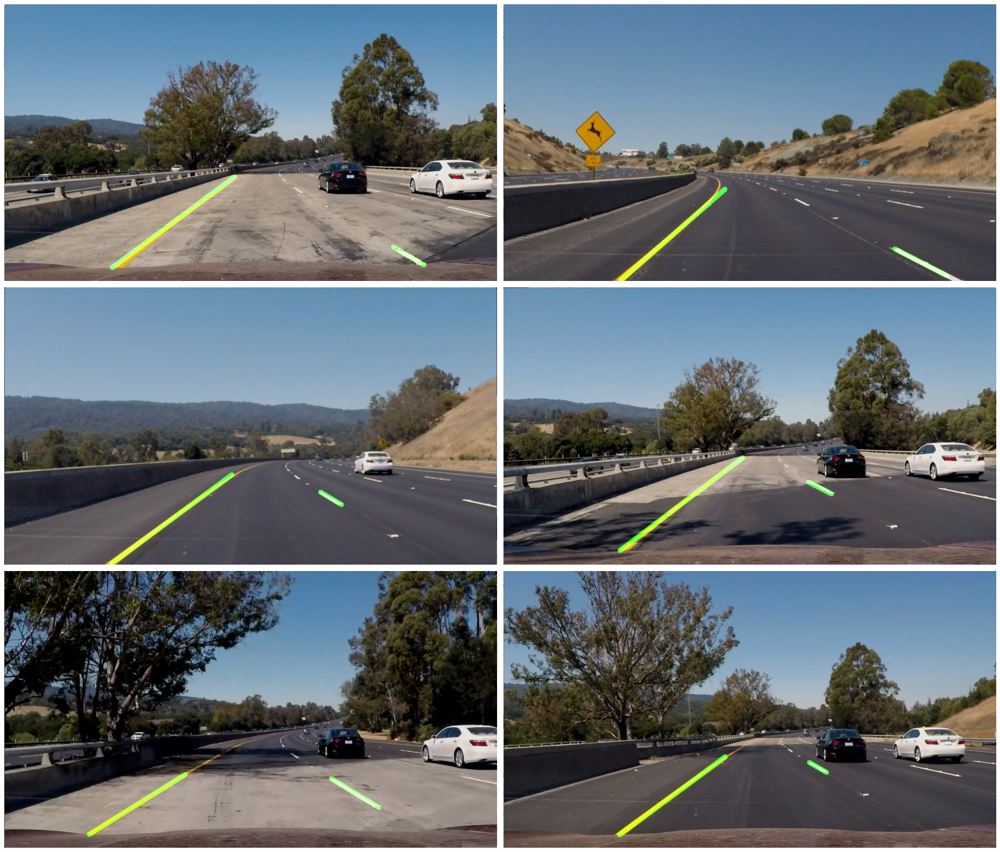

In [24]:
image_final = [0]*6
for i in range(0, 6):
    image_final[i] = lines(image[i])
ploting(image_final, 'jet')

Posto sam izvestaj pisao posle snimanja videa, ostavicu kod za snimanje videa dole kao komentar(da ne bih ponovo pustao taj deo koda). U predelima puta gde ima senke ima malih poteskoca za detekciju zute boje, jer sam uslov za segmentaciju nije izveden pod uslovom da posmatramo zutu boju u senci, ali za te frejmove bi mozda bilo moguce odraditi neku drugu segmentaciju koja ce u tim uslovima izdvojiti bolje zutu boju.

Slike iz videa kad se ucitaju su bile u BGR kolor sistemu pa je potrebno pre obrade vratiti ih u RGB kolor sistem.

In [30]:
# Kod za snimanje videa
"""""
cap = cv2.VideoCapture('video_road.avi')

# Get the Default resolutions
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))

# Define the codec and filename.
out = cv2.VideoWriter('video_road_final.avi',cv2.VideoWriter_fourcc('M','J','P','G'), 20, (frame_width,frame_height))

while(cap.isOpened()):
    ret, frame = cap.read()
    if ret==True:
        c = [2, 1, 0]
        pom = frame[:,:,c]
        img = pom.copy()
        x = lines(img)
        # write the  frame
        out.write(x[:,:,c])
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    else:
        break

# Release everything if job is finished
cap.release()
out.release()
cv2.destroyAllWindows()
"""""
x = 0